In [0]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from scipy.integrate import odeint
from matplotlib import animation
import matplotlib
import time
import sys
import math
from matplotlib import animation, rc, rcParams
from IPython.display import HTML
import time
import csv
from IPython.display import display

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
file_name = '/content/drive/My Drive/522_HW4_Files/swarm_03242020_3000steps.csv'
my_data = []
with open(file_name) as csvDataFile:
  csvReader = csv.reader(csvDataFile)
  for row in csvReader:
    my_data.append(row)
pos_from_file = []
vel_from_file =[]
pos_line = []
vel_line = []

for i in range(len(my_data)):
  for j in range(int(len(my_data[0])/2)):
    try:
      pos_line_str = my_data[i][j*2].lstrip('[').rstrip(']').split()
      vel_line_str = my_data[i][j*2+1].lstrip('[').rstrip(']').split()
    except:
      pass
    pos_line.append([float(pos_line_str[0]), float(pos_line_str[1])])
    vel_line.append([float(vel_line_str[0]), float(vel_line_str[1])])
  pos_from_file.append(pos_line)
  vel_from_file.append(vel_line)
  pos_line = []
  vel_line = []

In [0]:
pos = []
vel =[]
for i in range(len(pos_from_file)):
    pos.append(np.asarray(pos_from_file[i]))
    vel.append(np.asarray(vel_from_file[i]))

In [9]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
pos = np.asarray(pos)
vel = np.asarray(vel)
print(vel.shape)

(3000, 32, 2)


In [0]:
x = pos[:,:,0]
y = pos[:,:,1]
vx = vel[:,:,0]
vy = vel[:,:,1]

In [12]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [13]:
print(len(x[:,10]))

3000


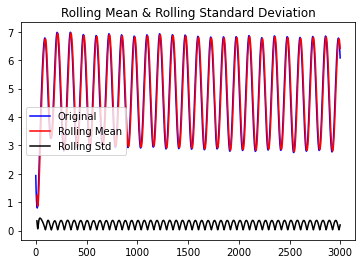

In [14]:
df = pd.DataFrame(y[:,0])

rolling_mean = df.rolling(window = 12).mean()
rolling_std = df.rolling(window = 12).std()
plt.plot(df, color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

In [0]:
import sklearn
from sklearn.metrics import mean_squared_error
import matplotlib
import matplotlib.pyplot as plt

In [0]:
from statsmodels.tsa.seasonal import seasonal_decompose
for i in range(32):    
    df = pd.DataFrame(y[:,i])
    #df = pd.DataFrame([np.square(x[:,i])+np.square(y[:,i])])
    result = seasonal_decompose(df.values, model='additive',freq = 1)
    #fig = result.plot()
    result.plot()
    #plt.show()

In [0]:
x = pos[:,:,0]
y = pos[:,:,1]
vx = vel[:,:,0]
vy = vel[:,:,1]

In [0]:
def create_train(array,in_samples,out_samples):
    l = len(array)
    x_train = []
    y_train = []
    for i in range(l-in_samples-1):
        row_x = array[i:i+in_samples] 
        row_y = array[i+in_samples:i+in_samples+out_samples]
        x_train.append(row_x)
        y_train.append(row_y) 
    #print(np.asarray(y_train).shape)
    return x_train,y_train

In [0]:
NUMBER_OF_AGENTS = 32

posx = pos[:,:,0][:2000]
posy = pos[:,:,1][:2000]
velx = vel[:,:,0][:2000]
vely = vel[:,:,1][:2000]

x_array = {}
x_label = {}
y_array = {}
y_label = {}
vx_array = {}
vx_label = {}
vy_array = {}
vy_label = {}

solx = {}
soly = {}
solvx = {}
solvy = {}

in_samples = 10
out_samples = 1
for a in range(NUMBER_OF_AGENTS):
    x_array[a],x_label[a] = create_train(posx[:,a],in_samples,out_samples)
    y_array[a],y_label[a] = create_train(posy[:,a],in_samples,out_samples)
    vx_array[a],vx_label[a] = create_train(velx[:,a],in_samples,out_samples)
    vy_array[a],vy_label[a] = create_train(vely[:,a],in_samples,out_samples)
    #print(a)
    
    solx[a] = np.linalg.lstsq(np.asarray(x_array[a]),np.asarray(x_label[a]) , rcond=1)[0]
    soly[a] = np.linalg.lstsq(np.asarray(y_array[a]),np.asarray(y_label[a]) , rcond=1)[0]
    solvx[a] = np.linalg.lstsq(np.asarray(vx_array[a]),np.asarray(vx_label[a]) , rcond=1)[0]
    solvy[a] = np.linalg.lstsq(np.asarray(vy_array[a]),np.asarray(vy_label[a]) , rcond=1)[0]

In [0]:
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor
import torch.nn.functional as F
import random
import numpy as np
import matplotlib
import pandas as pd
import dill
from PIL import Image
import random
import torchvision
import torch.optim as optim
import matplotlib.pyplot as plt

In [19]:
test_posx = pos[:,:,0][2000:]
test_posy = pos[:,:,1][2000:]
test_velx = vel[:,:,0][2000:]
test_vely = vel[:,:,1][2000:]
print(test_posx.shape)

(1000, 32)


In [20]:
print(posx[-10:,:].shape)

(10, 32)


In [0]:
xin = posx[-10:,:]
yin = posy[-10:,:]
vxin = velx[-10:,:]
vyin = vely[-10:,:]

In [0]:
solution_x = np.asarray([np.hstack(np.asarray(solx[a])) for a in range(NUMBER_OF_AGENTS)])
solution_y = np.asarray([np.hstack(np.asarray(soly[a])) for a in range(NUMBER_OF_AGENTS)])
solution_vx =np.asarray([np.hstack(np.asarray(solvx[a])) for a in range(NUMBER_OF_AGENTS)])
solution_vy =np.asarray([np.hstack(np.asarray(solvy[a])) for a in range(NUMBER_OF_AGENTS)])

In [23]:
print(solution_x.shape)

(32, 10)


In [24]:
print(xin.shape)

(10, 32)


In [0]:
def predict_next_sample(in_array,weight_vector):
    # weight_vector is 1 X 10
    # in_array is 10 X 1
    pred = np.matmul(weight_vector,in_array)
    return pred  

In [0]:
xin = posx[-10:,:]
yin = posy[-10:,:]
vxin = velx[-10:,:]
vyin = vely[-10:,:]

xpr = []
ypr = []
vxpr = []
vypr = []

for i in range(1000):
    #print(i)
    px = np.diagonal(np.matmul(solution_x,xin))
    #print(px.shape)
    py = np.diagonal(np.matmul(solution_y,yin))
    pvx = np.diagonal(np.matmul(solution_vx,vxin))
    pvy = np.diagonal(np.matmul(solution_vy,vyin))
    
    px = px.reshape(1,NUMBER_OF_AGENTS)
    #print(px.shape)
    py = py.reshape(1,NUMBER_OF_AGENTS)
    pvx = pvx.reshape(1,NUMBER_OF_AGENTS)
    pvy = pvy.reshape(1,NUMBER_OF_AGENTS)
    
    xin = np.delete(xin, (0), axis=0)
    yin = np.delete(yin, (0), axis=0)
    vxin = np.delete(vxin, (0), axis=0)
    vyin = np.delete(vyin, (0), axis=0)
    
    xin = np.vstack([xin,px])
    #print(xin.shape)
    yin = np.vstack([yin,py])
    vxin = np.vstack([vxin,pvx])
    vyin = np.vstack([vyin,pvy])
    
    xpr.append(px)
    ypr.append(py)
    vxpr.append(pvx)
    vypr.append(pvy)
xpr = np.asarray(xpr).reshape(1000,32)
ypr = np.asarray(ypr).reshape(1000,32)
vxpr = np.asarray(vxpr).reshape(1000,32)
vypr = np.asarray(vypr).reshape(1000,32)

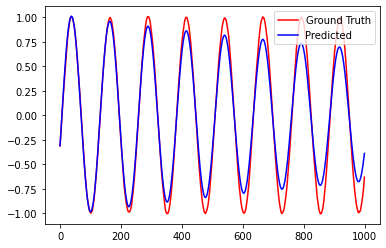

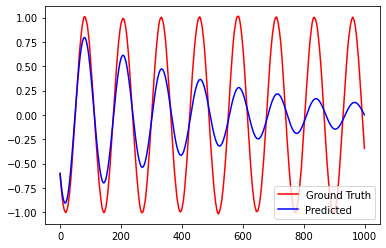

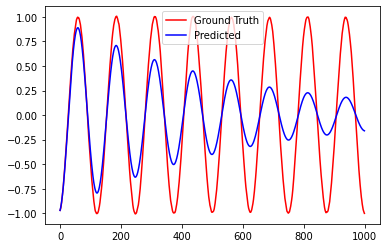

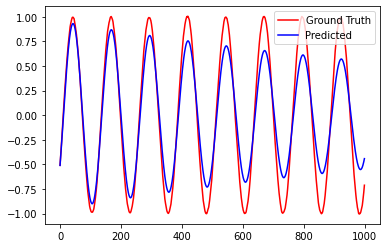

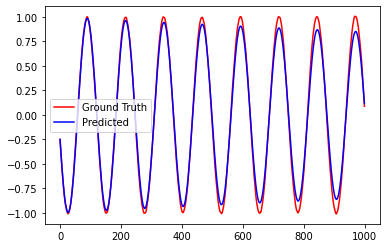

...

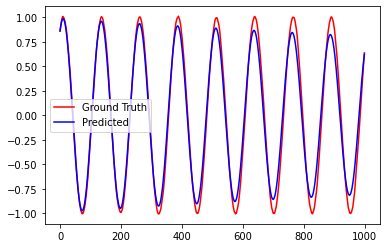

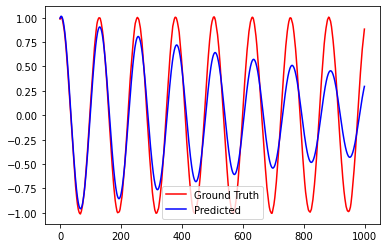

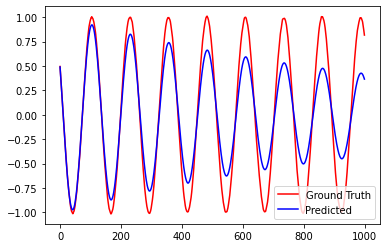

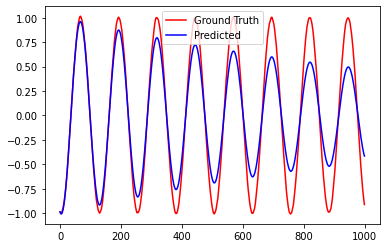

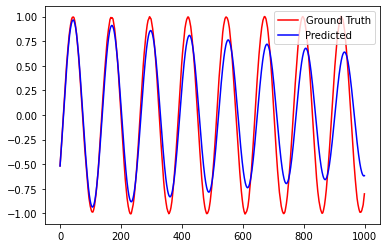

In [27]:
for a in range(NUMBER_OF_AGENTS):
    truth, = plt.plot(test_velx[:,a],color = 'red',label = 'Ground Truth')
    predicted, = plt.plot(vxpr[:,a],color = 'blue',label = 'Predicted')
    plt.legend(handles=[truth, predicted])
    plt.show()

Predicted number of time steps:  1000


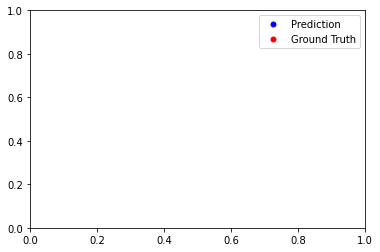

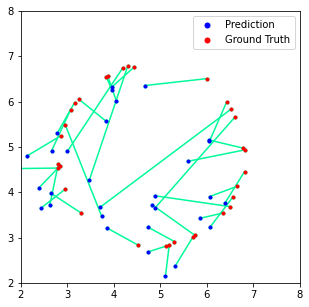

In [30]:
############ REPLAYING FILES ############
from matplotlib.lines import Line2D
import matplotlib.lines as mlines

blue_dot = mlines.Line2D([], [], color='blue', marker='.', linestyle='None',
                          markersize=10, label='Prediction')
red_dot = mlines.Line2D([], [], color='red', marker='.', linestyle='None',
                          markersize=10, label='Ground Truth')
plt.legend(handles=[blue_dot, red_dot])
pred_len = len(xpr)
print("Predicted number of time steps: ", pred_len)


fig = plt.figure()
fig.set_size_inches(5, 5)
ax = plt.axes(xlim=(2,8),ylim=(2,8))

x = xpr
y = ypr

x_gt = test_posx
y_gt = test_posy


g = [Line2D([x_gt[0][0], x[0][0]],[y_gt[0][0], y[0][0]]) for i in range(32)]
for j in range(32):
  g[j], = ax.plot([x_gt[0][j], x[0][j]],[y_gt[0][j], y[0][j]], c='mediumspringgreen',marker='.')
d, = ax.plot(x[0],y[0], c='blue',marker='.',linestyle='None')
e, = ax.plot(x_gt[0],y_gt[0], c='red',marker='.',linestyle='None')


def animate(i):
    plt.legend(handles=[blue_dot, red_dot])
    # plotting a line between every pair of points
    for j in range(32):
      g[j].set_data([x_gt[i][j], x[i][j]],[y_gt[i][j], y[i][j]])
    
    d.set_data(x[i],y[i])
    e.set_data(x_gt[i],y_gt[i])
    return d, e

# call the animator.  blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, frames=700, interval=20, blit=True)
anim.save('compare_700steps.mp4',writer=animation.FFMpegWriter(fps=10))
rc('animation', html='jshtml')
anim

In [0]:
# grid search sarima hyperparameters for monthly shampoo sales dataset
from math import sqrt
from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed
from warnings import catch_warnings
from warnings import filterwarnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
from pandas import read_csv

# one-step sarima forecast
def sarima_forecast(history, config):
    order, sorder, trend = config
    # define model
    model = SARIMAX(history, order=order, seasonal_order=sorder, trend=trend,
    enforce_stationarity=False, enforce_invertibility=False)
    # fit model
    model_fit = model.fit(disp=False)
    # make one step forecast
    yhat = model_fit.predict(len(history), len(history))
    return yhat[0]

# root mean squared error or rmse
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
    return data[:-n_test], data[-n_test:]

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test, cfg):
    predictions = list()
    # split dataset
    train, test = train_test_split(data, n_test)
    # seed history with training dataset
    history = [x for x in train]
    # step over each time-step in the test set
    for i in range(len(test)):
        # fit model and make forecast for history
        yhat = sarima_forecast(history, cfg)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
    # estimate prediction error
    error = measure_rmse(test, predictions)
    return error

# score a model, return None on failure
def score_model(data, n_test, cfg, debug=False):
    result = None
    # convert config to a key
    key = str(cfg)
    # show all warnings and fail on exception if debugging
    if debug:
        result = walk_forward_validation(data, n_test, cfg)
    else:
        # one failure during model validation suggests an unstable config
        try:
        # never show warnings when grid searching, too noisy
            with catch_warnings():
                filterwarnings("ignore")
                result = walk_forward_validation(data, n_test, cfg)
        except:
            error = None
        # check for an interesting result
    if result is not None:
        print(' > Model[%s] %.3f' % (key, result))
    return (key, result)


# grid search configs
def grid_search(data, cfg_list, n_test, parallel=True):
    scores = None
    if parallel:
        # execute configs in parallel
        executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing')
        tasks = (delayed(score_model)(data, n_test, cfg) for cfg in cfg_list)
        scores = executor(tasks)
    else:
        scores = [score_model(data, n_test, cfg) for cfg in cfg_list]
        # remove empty results
        scores = [r for r in scores if r[1] != None]
        # sort configs by error, asc
        scores.sort(key=lambda tup: tup[1])
    return scores

# create a set of sarima configs to try
def sarima_configs(seasonal=[0]):
    models = list()
    # define config lists
    p_params = [0, 1, 2]
    d_params = [0, 1]
    q_params = [0, 1, 2]
    t_params = ['n','c','t','ct']
    P_params = [0, 1, 2]
    D_params = [0, 1]
    Q_params = [0, 1, 2]
    m_params = seasonal
    # create config instances
    for p in p_params:
        for d in d_params:
            for q in q_params:
                for t in t_params:
                    for P in P_params:
                        for D in D_params:
                            for Q in Q_params:
                                for m in m_params:
                                    cfg = [(p,d,q), (P,D,Q,m), t]
                                    models.append(cfg)
    return models

if __name__ == '__main__':
    # load dataset
    #series = read_csv('monthly-shampoo-sales.csv', header=0, index_col=0)
    series = x
    #data = series.values
    data = series
    # data split
    n_test = 500
    # model configs
    cfg_list = sarima_configs()
    # grid search
    scores = grid_search(data, cfg_list, n_test)
    print('done')
    # list top 3 configs
    for cfg, error in scores[:3]:
        print(cfg, error)

done
[(0, 0, 0), (0, 0, 0, 0), 'n'] None
[(0, 0, 0), (0, 0, 1, 0), 'n'] None
[(0, 0, 0), (0, 0, 2, 0), 'n'] None
